In [10]:

from pathlib import Path
import plotly
from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_retrieval, pairs_from_exhaustive

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. We choose the [South-Building dataset](https://openaccess.thecvf.com/content_cvpr_2013/html/Hane_Joint_3D_Scene_2013_CVPR_paper.html) - we will download it later. First, we define some paths.

In [2]:
images = Path('/home/biorobotics/Documents/dataset')

outputs = Path('outputs/sfm/')
sfm_pairs = outputs / 'pairs-netvlad.txt'
sfm_dir = outputs / 'sfm_superpoint+superglue'

retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

## Find image pairs via image retrieval
We extract global descriptors with NetVLAD and find for each image the most similar ones. For smaller dataset we can instead use exhaustive matching via `hloc/pairs_from_exhaustive.py`, which would find $\frac{n(n-1)}{2}$ images pairs.

In [3]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=5)

[2022/10/20 01:52:04 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2022/10/20 01:52:04 hloc INFO] Found 229 images in root /home/biorobotics/Documents/dataset.
[2022/10/20 01:52:04 hloc INFO] Skipping the extraction.
[2022/10/20 01:52:04 hloc INFO] Extracting image pairs from a retrieval database.


['3DGrid(24)_S2.JPG', '3DGrid(11)_S2.JPG', '3DGrid(14)_S2.JPG', '3DGrid(129)_S2.JPG', '3DGrid(196)_S2.JPG', '3DGrid(212)_S2.JPG', '3DGrid(135)_S2.JPG', '3DGrid(146)_S2.JPG', '3DGrid(104)_S2.JPG', '3DGrid(223)_S2.JPG', '3DGrid(124)_S2.JPG', '3DGrid(26)_S2.JPG', '3DGrid(230)_S2.JPG', '3DGrid(107)_S2.JPG', '3DGrid(125)_S2.JPG', '3DGrid(23)_S2.JPG', '3DGrid(49)_S2.JPG', '3DGrid(75)_S2.JPG', '3DGrid(147)_S2.JPG', '3DGrid(216)_S2.JPG', '3DGrid(210)_S2.JPG', '3DGrid(87)_S2.JPG', '3DGrid(27)_S2.JPG', '3DGrid(53)_S2.JPG', '3DGrid(117)_S2.JPG', '3DGrid(29)_S2.JPG', '3DGrid(218)_S2.JPG', '3DGrid(166)_S2.JPG', '3DGrid(217)_S2.JPG', '3DGrid(37)_S2.JPG', '3DGrid(94)_S2.JPG', '3DGrid(154)_S2.JPG', '3DGrid(145)_S2.JPG', '3DGrid(110)_S2.JPG', '3DGrid(105)_S2.JPG', '3DGrid(192)_S2.JPG', '3DGrid(82)_S2.JPG', '3DGrid(215)_S2.JPG', '3DGrid(149)_S2.JPG', '3DGrid(97)_S2.JPG', '3DGrid(52)_S2.JPG', '3DGrid(91)_S2.JPG', '3DGrid(51)_S2.JPG', '3DGrid(220)_S2.JPG', '3DGrid(181)_S2.JPG', '3DGrid(189)_S2.JPG', '3DGr

[2022/10/20 01:52:07 hloc INFO] Found 1145 pairs.


## Extract and match local features

In [4]:
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(matcher_conf, sfm_pairs, feature_conf['output'], outputs)

[2022/10/20 01:52:12 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2022/10/20 01:52:12 hloc INFO] Found 229 images in root /home/biorobotics/Documents/dataset.
[2022/10/20 01:52:12 hloc INFO] Skipping the extraction.
[2022/10/20 01:52:12 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}
[2022/10/20 01:52:13 hloc INFO] Skipping the matching.


3DGrid(216)_S2.JPG 3DGrid(217)_S2.JPG
3DGrid(216)_S2.JPG 3DGrid(215)_S2.JPG
3DGrid(216)_S2.JPG 3DGrid(218)_S2.JPG
3DGrid(216)_S2.JPG 3DGrid(214)_S2.JPG
3DGrid(216)_S2.JPG 3DGrid(213)_S2.JPG
3DGrid(199)_S2.JPG 3DGrid(200)_S2.JPG
3DGrid(199)_S2.JPG 3DGrid(197)_S2.JPG
3DGrid(199)_S2.JPG 3DGrid(201)_S2.JPG
3DGrid(199)_S2.JPG 3DGrid(223)_S2.JPG
3DGrid(199)_S2.JPG 3DGrid(196)_S2.JPG
3DGrid(95)_S2.JPG 3DGrid(123)_S2.JPG
3DGrid(95)_S2.JPG 3DGrid(94)_S2.JPG
3DGrid(95)_S2.JPG 3DGrid(122)_S2.JPG
3DGrid(95)_S2.JPG 3DGrid(96)_S2.JPG
3DGrid(95)_S2.JPG 3DGrid(124)_S2.JPG
3DGrid(226)_S2.JPG 3DGrid(227)_S2.JPG
3DGrid(226)_S2.JPG 3DGrid(225)_S2.JPG
3DGrid(226)_S2.JPG 3DGrid(228)_S2.JPG
3DGrid(226)_S2.JPG 3DGrid(224)_S2.JPG
3DGrid(226)_S2.JPG 3DGrid(229)_S2.JPG
3DGrid(209)_S2.JPG 3DGrid(208)_S2.JPG
3DGrid(209)_S2.JPG 3DGrid(210)_S2.JPG
3DGrid(209)_S2.JPG 3DGrid(211)_S2.JPG
3DGrid(209)_S2.JPG 3DGrid(212)_S2.JPG
3DGrid(209)_S2.JPG 3DGrid(2)_S2.JPG
3DGrid(104)_S2.JPG 3DGrid(105)_S2.JPG
3DGrid(104)_S2.JPG 3D

## 3D reconstruction
Run COLMAP on the features and matches.

In [5]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2022/10/20 01:52:17 hloc WARNING] The database already exists, deleting it.
[2022/10/20 01:52:17 hloc INFO] Creating an empty database...
[2022/10/20 01:52:17 hloc INFO] Importing images into the database...
[2022/10/20 01:53:12 hloc INFO] Importing features into the database...
100%|████████████████████████████████████████| 229/229 [00:00<00:00, 637.79it/s]
[2022/10/20 01:53:12 hloc INFO] Importing matches into the database...
100%|█████████████████████████████████████| 1145/1145 [00:00<00:00, 1496.85it/s]
[2022/10/20 01:53:13 hloc INFO] Performing geometric verification of the matches...
[2022/10/20 01:53:36 hloc INFO] Running 3D reconstruction...
[2022/10/20 01:59:02 hloc INFO] Reconstructed 4 model(s).
[2022/10/20 01:59:02 hloc INFO] Largest model is #2 with 60 images.
[2022/10/20 01:59:02 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 60
	num_cameras = 1
	num_points3D = 31706
	num_observations = 105650
	mean_track_length = 3.33218
	mean_observations_per_i

## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

In [6]:
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

## Localization

In [18]:

query = '/home/biorobotics/Documents/dataset/3DGrid(6)_S2.JPG'
loc_pairs = outputs / 'pairs-loc.txt'
references_registered = [model.images[i].name for i in model.reg_image_ids()]
extract_features.main(feature_conf, images, image_list=[query], feature_path=feature_path, overwrite=True)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references_registered)
match_features.main(matcher_conf, loc_pairs, features=feature_path, matches=match_path, overwrite=True)

[2022/10/20 02:27:38 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.25it/s]
[2022/10/20 02:27:38 hloc INFO] Finished exporting features.
[2022/10/20 02:27:38 hloc INFO] Found 60 pairs.
[2022/10/20 02:27:38 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(56)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(32)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(55)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(57)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(54)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(58)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(59)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(53)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(81)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(80)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(82)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(83)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(79)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(1)_S2.JPG 3DGrid(78)_S2.JPG
/home/

100%|███████████████████████████████████████████| 60/60 [00:47<00:00,  1.26it/s]
[2022/10/20 02:28:26 hloc INFO] Finished exporting matches.
[2022/10/20 02:28:27 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.56it/s]
[2022/10/20 02:28:27 hloc INFO] Finished exporting features.
[2022/10/20 02:28:27 hloc INFO] Found 60 pairs.
[2022/10/20 02:28:27 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(56)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(32)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(55)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(57)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(54)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(58)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(59)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(53)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(81)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(80)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(82)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(83)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(79)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(2)_S2.JPG 3DGrid(78)_S2.JPG
/home/

100%|███████████████████████████████████████████| 60/60 [00:47<00:00,  1.27it/s]
[2022/10/20 02:29:15 hloc INFO] Finished exporting matches.
[2022/10/20 02:29:16 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.88it/s]
[2022/10/20 02:29:16 hloc INFO] Finished exporting features.
[2022/10/20 02:29:16 hloc INFO] Found 60 pairs.
[2022/10/20 02:29:16 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(56)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(32)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(55)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(57)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(54)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(58)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(59)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(53)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(81)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(80)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(82)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(83)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(79)_S2.JPG
/home/biorobotics/Documents/dataset/3DGrid(3)_S2.JPG 3DGrid(78)_S2.JPG
/home/

100%|███████████████████████████████████████████| 60/60 [00:44<00:00,  1.35it/s]
[2022/10/20 02:30:01 hloc INFO] Finished exporting matches.


KeyboardInterrupt: 

## Visualize camera pose

In [17]:
pose = pycolmap.Image(tvec=ret['tvec'], qvec=ret['qvec'])
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=query)
fig.show()

/tmp/ipykernel_276203/2994577085.py:113: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


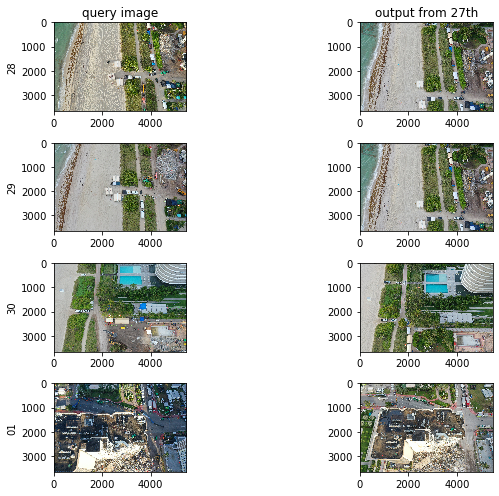

In [10]:


import matplotlib.pyplot as plt
from PIL import Image

path = '/home/biorobotics/Documents/col_ws'

image281 = plt.imread(path + '/sortie28/S3_3DGrid (1).JPG')
image282 = plt.imread(path + '/sortie28/S3_3DGrid (2).JPG')
image283 = plt.imread(path + '/sortie28/S3_3DGrid (3).JPG')
image284 = plt.imread(path + '/sortie28/S3_3DGrid (4).JPG')
image285 = plt.imread(path + '/sortie28/S3_3DGrid (5).JPG')
image2781 = plt.imread(path + '/sortie27/images/S2_3DGrid (196).JPG')
image2782 = plt.imread(path + '/sortie27/images/S2_3DGrid (196).JPG')
image2783 = plt.imread(path + '/sortie27/images/S2_3DGrid (197).JPG')
image2784 = plt.imread(path + '/sortie27/images/S2_3DGrid (197).JPG')
image2785 = plt.imread(path + '/sortie27/images/S2_3DGrid (199).JPG')

image291 = plt.imread(path + '/sortie29/S5_3DGrid (1).JPG')
image292 = plt.imread(path + '/sortie29/S5_3DGrid (2).JPG')
image293 = plt.imread(path + '/sortie29/S5_3DGrid (3).JPG')
image294 = plt.imread(path + '/sortie29/S5_3DGrid (4).JPG')
image295 = plt.imread(path + '/sortie29/S5_3DGrid (5).JPG')
image2791 = plt.imread(path + '/sortie27/images/S2_3DGrid (196).JPG')
image2792 = plt.imread(path + '/sortie27/images/S2_3DGrid (196).JPG')
image2793 = plt.imread(path + '/sortie27/images/S2_3DGrid (196).JPG')
image2794 = plt.imread(path + '/sortie27/images/S2_3DGrid (197).JPG')
image2795 = plt.imread(path + '/sortie27/images/S2_3DGrid (197).JPG')

image301 = plt.imread(path + '/sortie30/S6_3DGrid (223).JPG')
image302 = plt.imread(path + '/sortie30/S6_3DGrid (224).JPG')
image303 = plt.imread(path + '/sortie30/S6_3DGrid (225).JPG')
image304 = plt.imread(path + '/sortie30/S6_3DGrid (226).JPG')
image305 = plt.imread(path + '/sortie30/S6_3DGrid (227).JPG')
image2731 =plt.imread( path + '/sortie27//images/S2_3DGrid (225).JPG')
image2732 = plt.imread(path + '/sortie27/images/S2_3DGrid (225).JPG')
image2733 = plt.imread(path + '/sortie27/images/S2_3DGrid (227).JPG')
image2734 = plt.imread(path + '/sortie27/images/S2_3DGrid (228).JPG')
image2735 = plt.imread(path + '/sortie27/images/S2_3DGrid (230).JPG')


image011 = plt.imread(path + '/sortie01/S4_3DGrid (223).JPG')
image012 = plt.imread(path + '/sortie01/S4_3DGrid (224).JPG')
image013 = plt.imread(path + '/sortie01/S4_3DGrid (225).JPG')
image014 = plt.imread(path + '/sortie01/S4_3DGrid (226).JPG')
image015 = plt.imread(path + '/sortie01/S4_3DGrid (227).JPG')
image2711 = plt.imread(path + '/sortie27/images/S2_3DGrid (132).JPG')
image2712 = plt.imread(path + '/sortie27/images/S2_3DGrid (133).JPG')
image2713 = plt.imread(path + '/sortie27/images/S2_3DGrid (134).JPG')
image2714 = plt.imread(path + '/sortie27/images/S2_3DGrid (135).JPG')
image2715 = plt.imread(path + '/sortie27/images/S2_3DGrid (136).JPG')

fig = plt.figure(figsize=(10, 7))
  
# setting values to rows and column variables
rows = 4
columns = 2

fig.add_subplot(rows, columns, 1)
  
# showing image
plt.imshow(image281)
plt.ylabel('28')
plt.title('query image')

fig.add_subplot(rows, columns, 2)
  
# showing image
plt.imshow(image2781)
plt.title('output from 27th')

fig.add_subplot(rows, columns, 3)
  
# showing image
plt.imshow(image291)
plt.ylabel('29')

  
fig.add_subplot(rows, columns, 4)
  
# showing image
plt.imshow(image2791)


fig.add_subplot(rows, columns, 5)
  
# showing image
plt.imshow(image301)
plt.ylabel('30')



fig.add_subplot(rows, columns, 6)
  
# showing image
plt.imshow(image2731)


fig.add_subplot(rows, columns, 7)
  
# showing image
plt.imshow(image011)
plt.ylabel('01')

  
fig.add_subplot(rows, columns, 8)
  
# showing image
plt.imshow(image2711)

  
    

fig.tight_layout()
fig.show()